# Project on House Price Prediction using Regression Analysis 

## Importing libraries

In [1]:
################################## Data Analysis & Calculation ##################################

import pandas as pd 
import numpy as np 
import warnings
warnings.filterwarnings("ignore")
################# Machine Learning ################
import statsmodels
from statsmodels.stats.anova import anova_lm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import AdaBoostClassifier  
from sklearn.ensemble import GradientBoostingRegressor  
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
################# Data Visualization ################
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
from sklearn import model_selection
from sklearn import metrics
import matplotlib.pyplot as plt

## Data Import

In [2]:
data=pd.read_csv(r"C:\Users\justw\Downloads\Machine Learning with Python\AA Project\Project on House Price Prediction using Regression Analysis\kc_house_data.csv")
data.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900,3,1.00,1180,5650,1.0,3,7,1180,0,1955,98178,47.5112,-122.257,1340,5650
1,538000,3,2.25,2570,7242,2.0,3,7,2170,400,1951,98125,47.7210,-122.319,1690,7639
2,180000,2,1.00,770,10000,1.0,3,6,770,0,1933,98028,47.7379,-122.233,2720,8062
3,604000,4,3.00,1960,5000,1.0,5,7,1050,910,1965,98136,47.5208,-122.393,1360,5000
4,510000,3,2.00,1680,8080,1.0,3,8,1680,0,1987,98074,47.6168,-122.045,1800,7503


## Exploratory Data Analysis

In [3]:
data.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900,3,1.00,1180,5650,1.0,3,7,1180,0,1955,98178,47.5112,-122.257,1340,5650
1,538000,3,2.25,2570,7242,2.0,3,7,2170,400,1951,98125,47.7210,-122.319,1690,7639
2,180000,2,1.00,770,10000,1.0,3,6,770,0,1933,98028,47.7379,-122.233,2720,8062
3,604000,4,3.00,1960,5000,1.0,5,7,1050,910,1965,98136,47.5208,-122.393,1360,5000
4,510000,3,2.00,1680,8080,1.0,3,8,1680,0,1987,98074,47.6168,-122.045,1800,7503


In [4]:
data.tail()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
21608,360000,3,2.50,1530,1131,3.0,3,8,1530,0,2009,98103,47.6993,-122.346,1530,1509
21609,400000,4,2.50,2310,5813,2.0,3,8,2310,0,2014,98146,47.5107,-122.362,1830,7200
21610,402101,2,0.75,1020,1350,2.0,3,7,1020,0,2009,98144,47.5944,-122.299,1020,2007
21611,400000,3,2.50,1600,2388,2.0,3,8,1600,0,2004,98027,47.5345,-122.069,1410,1287
21612,325000,2,0.75,1020,1076,2.0,3,7,1020,0,2008,98144,47.5941,-122.299,1020,1357


In [5]:
data.sample(7)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
3970,122000,2,1.00,730,6728,1.0,3,6,730,0,1953,98148,47.4275,-122.324,1170,7034
8109,440000,6,3.00,2510,5310,1.0,4,7,1460,1050,1944,98108,47.5533,-122.304,1390,5407
11229,395000,2,1.00,1200,6014,1.0,4,6,600,600,1949,98118,47.5357,-122.280,1270,4652
21449,650000,4,2.50,2210,4861,2.0,3,9,2210,0,2013,98117,47.6959,-122.364,1590,5080
7010,465000,3,1.50,1460,9879,1.0,3,7,1460,0,1956,98008,47.6346,-122.127,1610,10050
17261,280000,4,2.75,2230,10160,1.0,3,7,1400,830,1968,98168,47.5123,-122.320,1740,10080
21401,438000,2,1.00,980,1179,2.0,3,8,980,0,2010,98119,47.6381,-122.375,1190,1600


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21613 non-null  int64  
 1   bedrooms       21613 non-null  int64  
 2   bathrooms      21613 non-null  float64
 3   sqft_living    21613 non-null  int64  
 4   sqft_lot       21613 non-null  int64  
 5   floors         21613 non-null  float64
 6   condition      21613 non-null  int64  
 7   grade          21613 non-null  int64  
 8   sqft_above     21613 non-null  int64  
 9   sqft_basement  21613 non-null  int64  
 10  yr_built       21613 non-null  int64  
 11  zipcode        21613 non-null  int64  
 12  lat            21613 non-null  float64
 13  long           21613 non-null  float64
 14  sqft_living15  21613 non-null  int64  
 15  sqft_lot15     21613 non-null  int64  
dtypes: float64(4), int64(12)
memory usage: 2.6 MB


## Univariate Analysis 

In [7]:
data.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,3.409430,7.656873,1788.390691,291.509045,1971.005136,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.650743,1.175459,828.090978,442.575043,29.373411,53.505026,0.138564,0.140828,685.391304,27304.179631
min,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,3.000000,7.000000,1560.000000,0.000000,1975.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


## Identify & Treatment of Outliers

<AxesSubplot:>

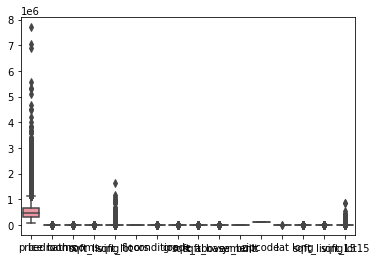

In [8]:
sns.boxplot(data=data)

In [9]:
for i in data:
    if data[i].dtypes in ("float64","int64"):
        q1 = data[i].quantile(0.25)
        q3 = data[i].quantile(0.75)
        iqr = q3-q1
        ul = q3 + 1.5*iqr
        ll = q1 - 1.5*iqr
        data[i].clip(upper=ul,lower=ll,inplace=True)

<AxesSubplot:>

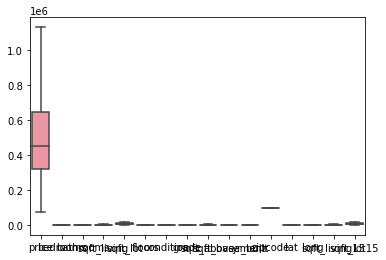

In [10]:
sns.boxplot(data=data)

* Outliers Treated Successfully. No Any Outlires seen in data.

In [11]:
data.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,5.115873e+05,3.362791,2.098477,2058.078564,8705.224448,1.494309,3.410124,7.598598,1769.563041,284.050155,1971.005136,98077.939805,47.560053,-122.214908,1975.112849,8298.152917
std,2.500026e+05,0.854105,0.722027,839.307806,5046.482073,0.539989,0.648435,1.001234,764.029323,417.064559,29.373411,53.505026,0.138563,0.137209,648.999108,4363.479209
min,7.500000e+04,1.500000,0.625000,290.000000,520.000000,1.000000,1.500000,5.500000,290.000000,0.000000,1900.000000,98001.000000,47.160500,-122.519000,399.000000,651.000000
25%,3.219500e+05,3.000000,1.750000,1427.000000,5040.000000,1.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7618.000000,1.500000,3.000000,7.000000,1560.000000,0.000000,1975.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,10688.000000,2.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,1.129575e+06,5.500000,3.625000,4234.500000,19160.000000,3.500000,5.000000,9.500000,3740.000000,1400.000000,2015.000000,98199.000000,47.777600,-121.820500,3665.000000,17557.500000


## Checking Missing Values

In [12]:
data.isnull().sum()

price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

* No Missing Values are present in data.

## Data Visualization

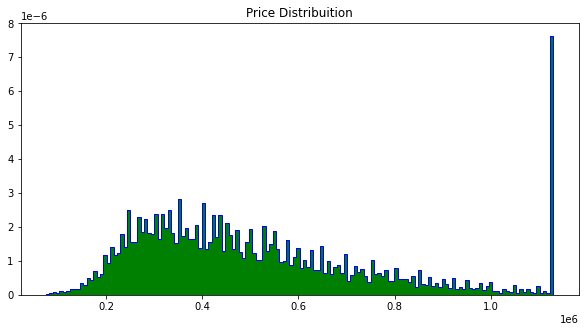

In [13]:
plt.figure(figsize =(10, 5))
plt.title('Price Distribuition')
plt.hist(data.price , bins =150 , color = "g" ,density =True)
plt.hist(data.price , bins =150 , color = "b" ,density =True , histtype='step' )
plt.show()

<AxesSubplot:xlabel='floors', ylabel='price'>

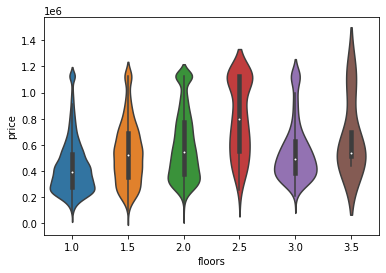

In [14]:
sns.violinplot(data =data,x = "floors" ,y ="price")

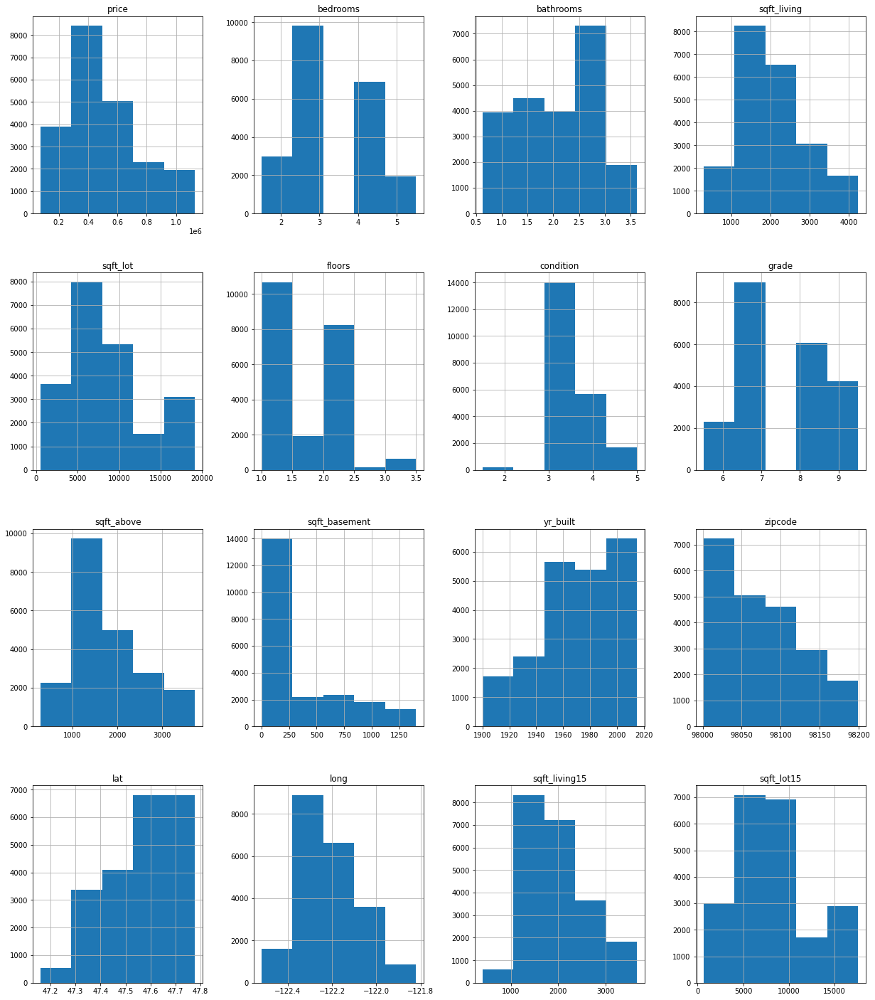

In [15]:
data.hist(bins=5, figsize=(21,25))
plt.show()

In [16]:
#sns.scatterplot(x='carat',y='price',data=data)

In [17]:
#sns.scatterplot(x='depth',y='price',data=data)

In [18]:
#sns.scatterplot(x='table',y='price',data=data)

In [19]:
#sns.scatterplot(x='height',y='price',data=data)

In [20]:
#sns.scatterplot(x='length',y='price',data=data)

In [21]:
#sns.scatterplot(x='width',y='price',data=data)

In [22]:
#sns.distplot(data=data)

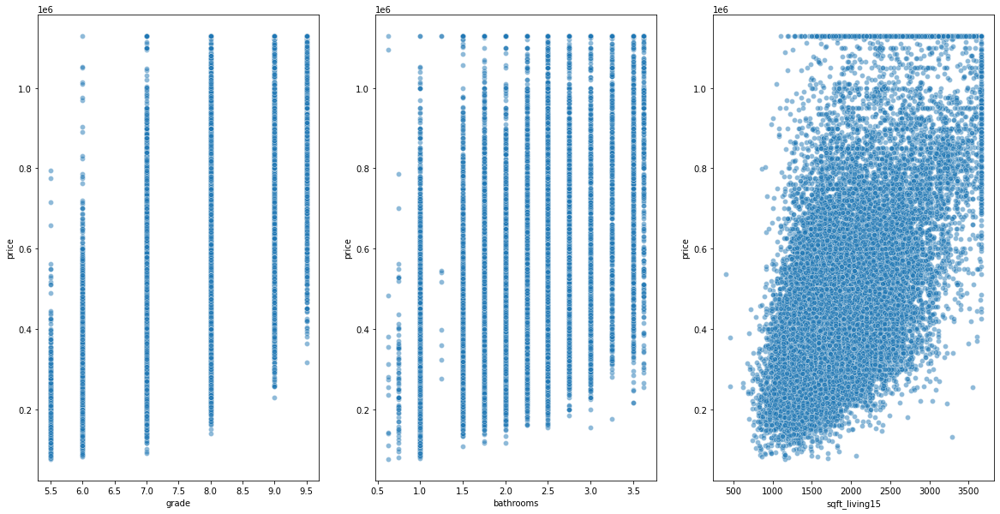

In [23]:
fig, axes = plt.subplots(1, 3, figsize = (20,10));

sns.scatterplot(y="price", x="grade", data=data, ax=axes[0], alpha=0.5);
sns.scatterplot(y="price", x="bathrooms", data=data, ax=axes[1], alpha=0.5);
sns.scatterplot(y="price", x="sqft_living15", data=data, ax=axes[2], alpha=0.5);

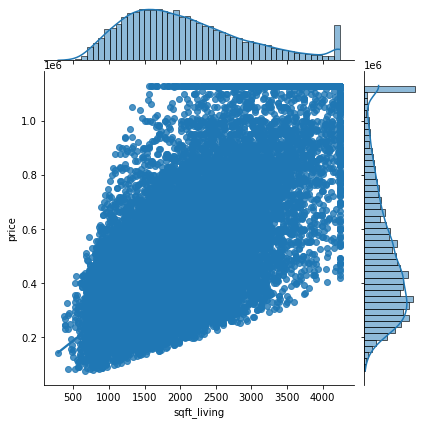

In [24]:
sns.jointplot(x="sqft_living", y="price", data=data[["sqft_living", "price"]], kind="reg")

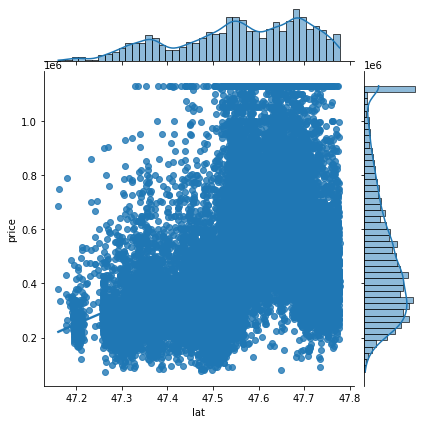

In [25]:
 sns.jointplot(x="lat", y="price", data=data[["lat", "price"]], kind="reg")

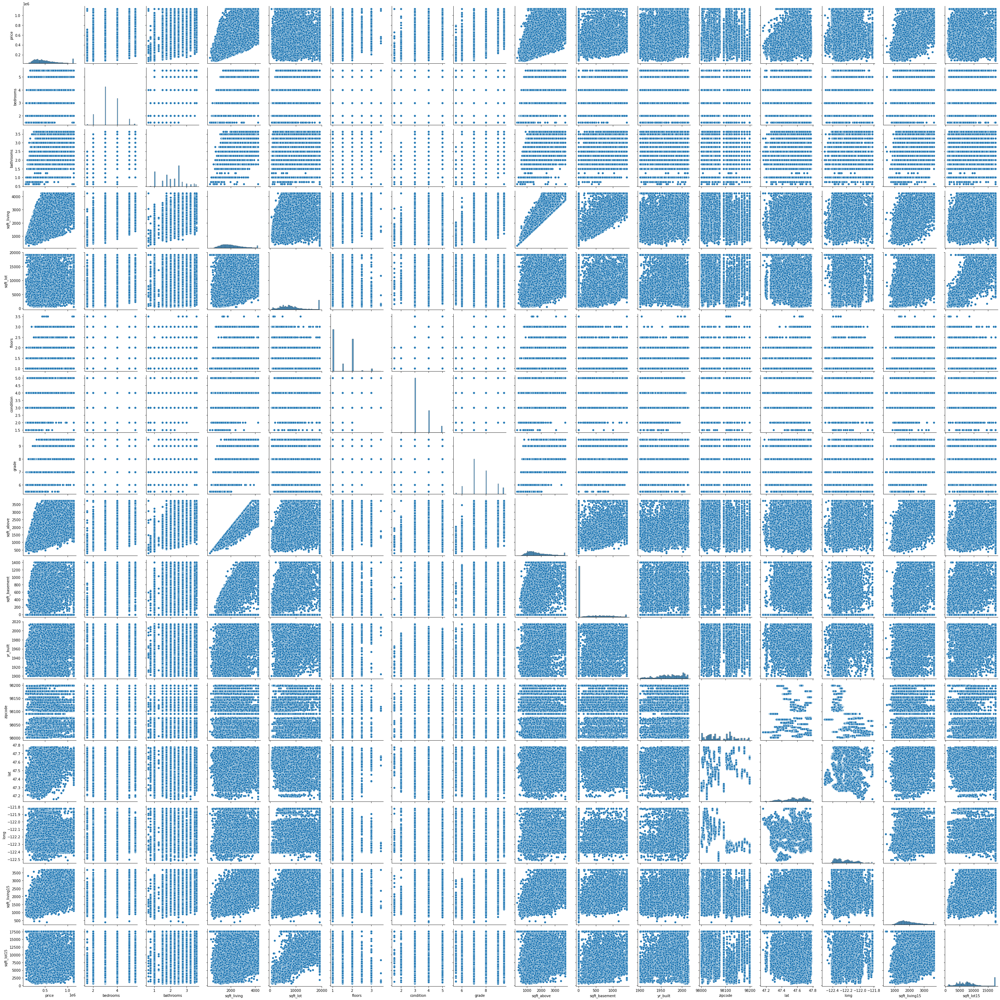

In [26]:
sns.pairplot(data=data)

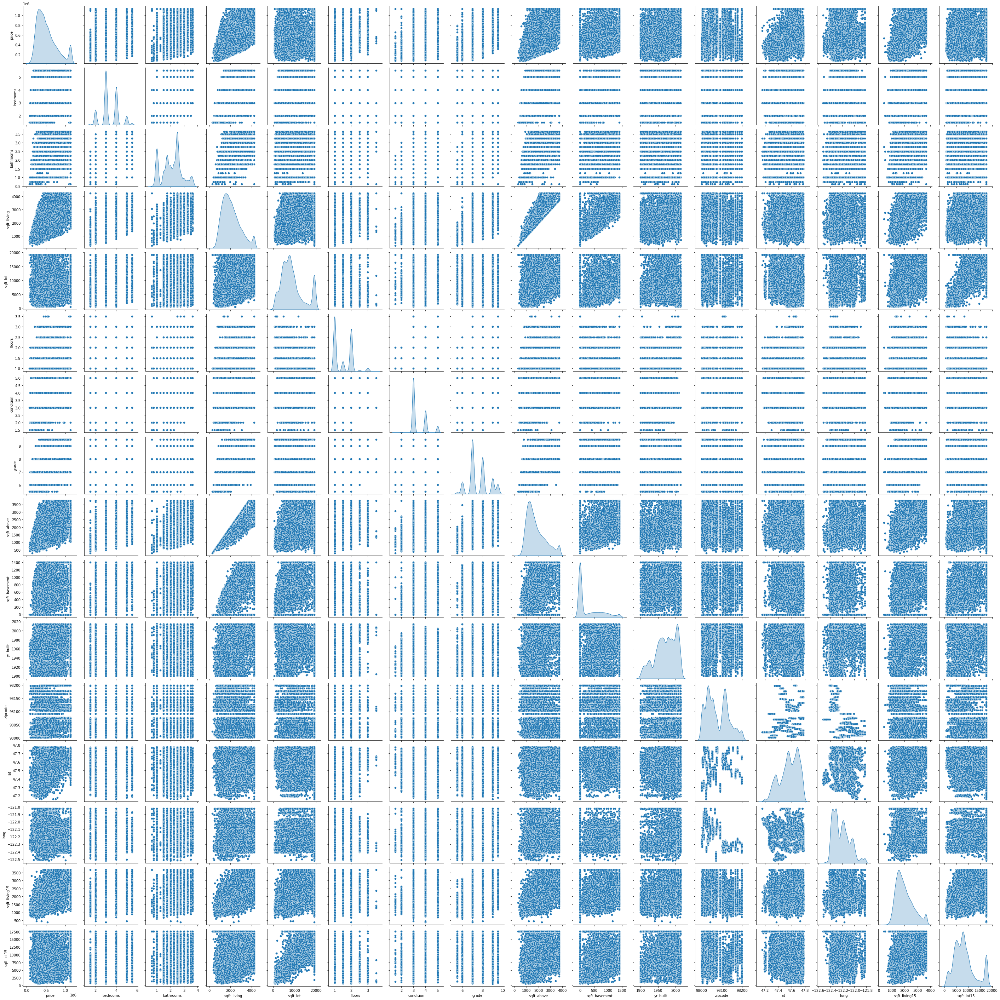

In [27]:
sns.pairplot(data, diag_kind="kde")

## Splitting the data in Training and Test set
* Using sklearn we split 70% of our data into training set and rest in test set.
* Setting random_state will give the same training and test set everytime on running the code

In [28]:
data.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3.0,1.00,1180.0,5650.0,1.0,3.0,7.0,1180.0,0.0,1955,98178,47.5112,-122.257,1340.0,5650.0
1,538000.0,3.0,2.25,2570.0,7242.0,2.0,3.0,7.0,2170.0,400.0,1951,98125,47.7210,-122.319,1690.0,7639.0
2,180000.0,2.0,1.00,770.0,10000.0,1.0,3.0,6.0,770.0,0.0,1933,98028,47.7379,-122.233,2720.0,8062.0
3,604000.0,4.0,3.00,1960.0,5000.0,1.0,5.0,7.0,1050.0,910.0,1965,98136,47.5208,-122.393,1360.0,5000.0
4,510000.0,3.0,2.00,1680.0,8080.0,1.0,3.0,8.0,1680.0,0.0,1987,98074,47.6168,-122.045,1800.0,7503.0


## Data partition

In [29]:
# Putting feature variable to X
x= data.drop('price', axis= 1)

# Putting response variable to y
y = data[['price']]

#random_state is the seed used by the random number generator. It can be any integer.
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test =train_test_split(x, y, train_size=0.7 ,random_state=120)

# Linear Regression Model

In [30]:
df = pd.concat([y_train, x_train], axis=1)
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
16941,160000.0,3.0,1.00,1140.0,3240.0,1.5,4.0,6.0,1140.0,0.0,1910,98014,47.7093,-121.8205,1140.0,4700.0
7310,585000.0,4.0,2.50,3000.0,6892.0,2.0,3.0,8.0,3000.0,0.0,2005,98072,47.7623,-122.1650,3000.0,6589.0
3004,441000.0,4.0,1.50,1100.0,3300.0,1.0,1.5,7.0,1100.0,0.0,1919,98122,47.6033,-122.2950,2020.0,4000.0
7412,552000.0,4.0,2.75,3160.0,8429.0,1.0,4.0,7.0,1620.0,1400.0,1982,98178,47.5110,-122.2510,1760.0,6780.0
20933,1129575.0,3.0,3.25,3530.0,4920.0,2.0,3.0,9.0,2660.0,870.0,2015,98109,47.6410,-122.3570,1900.0,4200.0


## Correlation Matrix

In [31]:
df.corr()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
price,1.000000,0.352983,0.529809,0.701960,0.168184,0.306472,0.050682,0.686576,0.604497,0.293295,0.060898,-0.039887,0.404380,0.049306,0.621357,0.162778
bedrooms,0.352983,1.000000,0.532920,0.620228,0.196642,0.186373,0.023514,0.380858,0.511309,0.309217,0.170519,-0.163761,-0.018704,0.149164,0.425541,0.185174
bathrooms,0.529809,0.532920,1.000000,0.745459,0.106355,0.514970,-0.123002,0.666347,0.673301,0.260485,0.519042,-0.207542,0.020980,0.233973,0.568561,0.099877
sqft_living,0.701960,0.620228,0.745459,1.000000,0.348219,0.363937,-0.053912,0.744464,0.868471,0.402763,0.328200,-0.203321,0.051959,0.259117,0.765491,0.333692
sqft_lot,0.168184,0.196642,0.106355,0.348219,1.000000,-0.194180,0.065576,0.197563,0.318608,0.101614,0.035552,-0.280219,-0.122917,0.351020,0.391275,0.909696
floors,0.306472,0.186373,0.514970,0.363937,-0.194180,1.000000,-0.253446,0.480847,0.542898,-0.254724,0.482706,-0.060810,0.056060,0.124676,0.284363,-0.196838
condition,0.050682,0.023514,-0.123002,-0.053912,0.065576,-0.253446,1.000000,-0.146091,-0.156960,0.178088,-0.367408,0.010222,-0.009995,-0.113743,-0.090229,0.072474
grade,0.686576,0.380858,0.666347,0.744464,0.197563,0.480847,-0.146091,1.000000,0.736567,0.139169,0.469478,-0.189349,0.114854,0.214416,0.698520,0.204733
sqft_above,0.604497,0.511309,0.673301,0.868471,0.318608,0.542898,-0.156960,0.736567,1.000000,-0.090171,0.437863,-0.266159,-0.001886,0.364532,0.735308,0.309532
sqft_basement,0.293295,0.309217,0.260485,0.402763,0.101614,-0.254724,0.178088,0.139169,-0.090171,1.000000,-0.147122,0.082661,0.107378,-0.154802,0.182738,0.090669


#### Correlation Of All Columns With Target Variable. More The Value Is Away From Zero, More The Feature Importance

In [32]:
df.corr()['price'].sort_values(ascending=False)

price            1.000000
sqft_living      0.701960
grade            0.686576
sqft_living15    0.621357
sqft_above       0.604497
bathrooms        0.529809
lat              0.404380
bedrooms         0.352983
floors           0.306472
sqft_basement    0.293295
sqft_lot         0.168184
sqft_lot15       0.162778
yr_built         0.060898
condition        0.050682
long             0.049306
zipcode         -0.039887
Name: price, dtype: float64

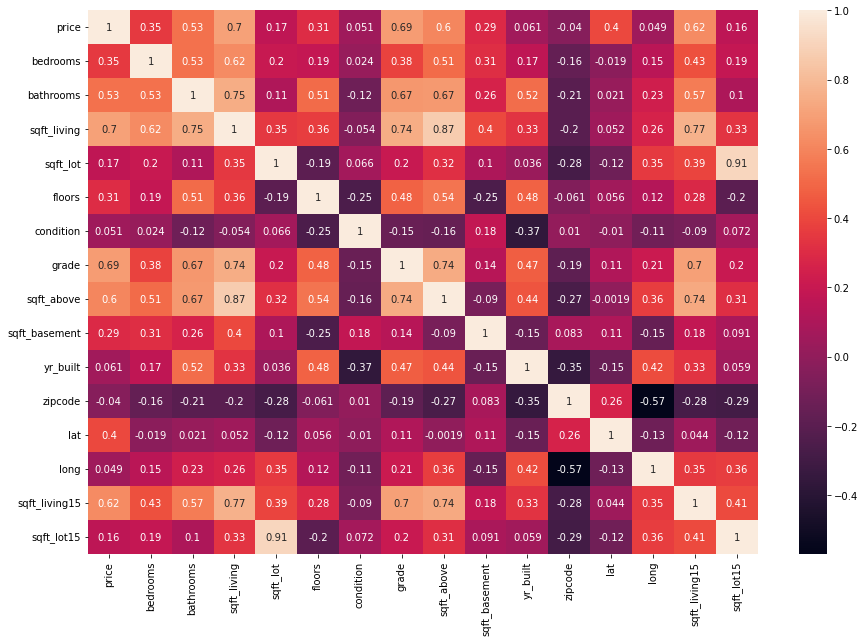

In [33]:
#sns.heatmap(df.corr(),annot=True)

plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), fmt=".2g", annot=True);

<AxesSubplot:>

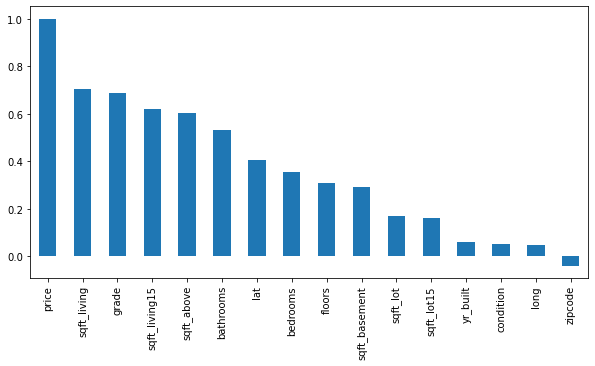

In [34]:
corr_mat=df.corr()
plt.figure(figsize=(10,5))
corr_mat['price'].sort_values(ascending=False).plot(kind='bar')

### Create A Distplot with Price Column

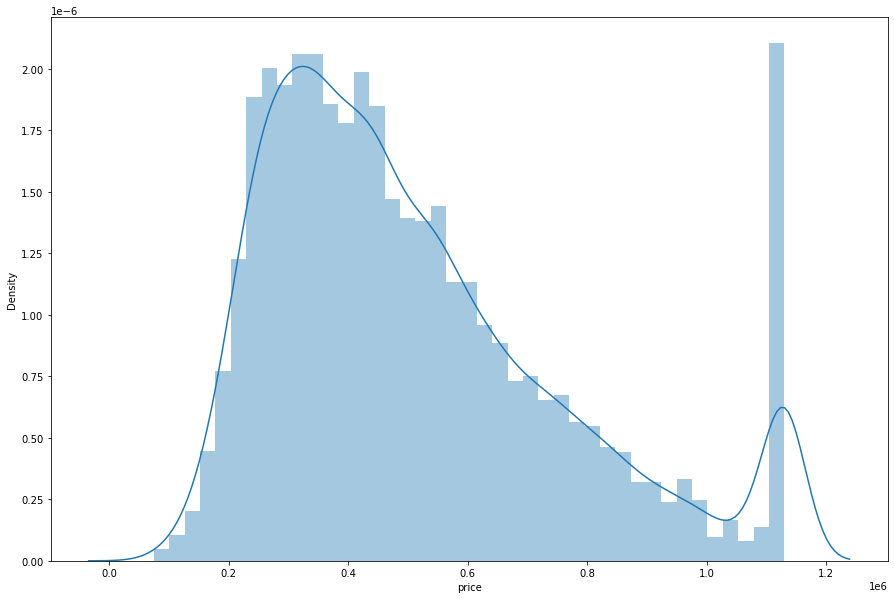

In [35]:
plt.figure(figsize=(15,10))
sns.distplot(df['price'],kde=True);

<AxesSubplot:title={'center':'price vs sqft_living'}, xlabel='sqft_living', ylabel='price'>

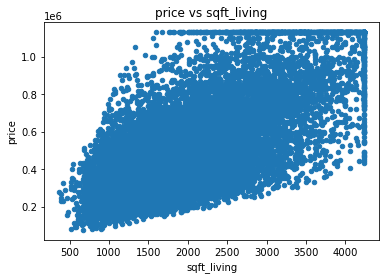

In [36]:
df.plot.scatter(x='sqft_living', y='price', title='price vs sqft_living')

#### HarvestedAcres have 89% strong positve correlation with Value
* HarvestedAcres have high impact on Value
* There is colinearity in data, So every platform is independent

## Multicolinearity (With the help of VIF)

In [37]:
X1=df.drop(['price'],axis=1)
series_before = pd.Series([variance_inflation_factor(X1.values, i) 
                           for i in range(X1.shape[1])],  # i=0,1,2
                          index=X1.columns)  # column name
series_before

bedrooms         2.895661e+01
bathrooms        3.114540e+01
sqft_living      5.821222e+02
sqft_lot         2.397167e+01
floors           1.987913e+01
condition        3.391893e+01
grade            1.861971e+02
sqft_above       4.486692e+02
sqft_basement    2.953871e+01
yr_built         8.619180e+03
zipcode          1.740208e+06
lat              1.388898e+05
long             1.459962e+06
sqft_living15    3.082190e+01
sqft_lot15       2.814642e+01
dtype: float64

* No collinearity in the data

# Model Building

##### H0 :- There is no Linear relationship between price and sqft_living , grade & condition.

##### Vs

##### H1 :- There is Linear relationship between price and sqft_living , grade & condition.

##### Alpha = 0.05 (5%)

In [38]:
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built',
       'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [39]:
import statsmodels.formula.api as smf
model = smf.ols('price ~ bedrooms + bathrooms +condition+floors+grade+ sqft_living + sqft_lot+sqft_above+sqft_basement+yr_built+zipcode+lat+long+sqft_living15+sqft_lot15',data=df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.737
Model:                            OLS   Adj. R-squared:                  0.737
Method:                 Least Squares   F-statistic:                     2830.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):               0.00
Time:                        23:00:36   Log-Likelihood:            -1.9936e+05
No. Observations:               15129   AIC:                         3.988e+05
Df Residuals:                   15113   BIC:                         3.989e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -8.768e+06   2.24e+06     -3.914      0.000   -1.32e+07   -4.38e+06
bedrooms      -2.412e+04   1618.625    -14.902      0.000   -2.73e+04   -2.09e+04
bathrooms      2.984e+04   2618.522     11.394      0.000    2.47e+04     3.5e+04
condition      2.479e+04   1757.898     14.103      0.000    2.13e+04    2.82e+04
floors         2.192e+04   2934.108      7.469      0.000    1.62e+04    2.77e+04
grade          8.803e+04   1858.621     47.365      0.000    8.44e+04    9.17e+04
sqft_living     131.8657     11.321     11.647      0.000     109.674     154.057
sqft_lot         -0.9436      0.509     -1.855      0.064      -1.941       0.053
sqft_above      -18.4003     11.473     -1.604      0.109     -40.889       4.089
sqft_basement   -21.5822     11.190     -1.929      0.054     -43.516       0.352
yr_built      -2214.3035     52.454    -42.214      0.000   -2317.120   -2111.487
zipcode        -275.0108     25.026    -10.989      0.000    -324.064    -225.957
lat            5.379e+05   8148.174     66.015      0.000    5.22e+05    5.54e+05
long           -1.14e+05   1.04e+04    -10.995      0.000   -1.34e+05   -9.37e+04
sqft_living15    58.8780      2.808     20.965      0.000      53.373      64.383
sqft_lot15       -0.7589      0.592     -1.283      0.200      -1.918       0.401
==============================================================================
Omnibus:                     1013.607   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1620.022
Skew:                           0.537   Prob(JB):                         0.00
Kurtosis:                       4.191   Cond. No.                     2.13e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.13e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [40]:
import statsmodels.formula.api as smf
model = smf.ols('price ~ bedrooms + bathrooms +condition+floors+grade+ sqft_living +yr_built+zipcode+lat+long+sqft_living15',data=df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.737
Model:                            OLS   Adj. R-squared:                  0.737
Method:                 Least Squares   F-statistic:                     3847.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):               0.00
Time:                        23:00:36   Log-Likelihood:            -1.9938e+05
No. Observations:               15129   AIC:                         3.988e+05
Df Residuals:                   15117   BIC:                         3.989e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -1.127e+07   2.17e+06     -5.193      0.000   -1.55e+07   -7.01e+06
bedrooms      -2.406e+04   1617.722    -14.872      0.000   -2.72e+04   -2.09e+04
bathrooms      3.125e+04   2557.447     12.218      0.000    2.62e+04    3.63e+04
condition      2.437e+04   1751.393     13.913      0.000    2.09e+04    2.78e+04
floors         2.741e+04   2449.999     11.188      0.000    2.26e+04    3.22e+04
grade          8.801e+04   1850.721     47.554      0.000    8.44e+04    9.16e+04
sqft_living     109.4576      2.755     39.737      0.000     104.058     114.857
yr_built      -2201.0048     52.332    -42.059      0.000   -2303.582   -2098.428
zipcode        -266.4965     25.000    -10.660      0.000    -315.499    -217.494
lat            5.426e+05   8073.899     67.203      0.000    5.27e+05    5.58e+05
long          -1.255e+05   9961.786    -12.594      0.000   -1.45e+05   -1.06e+05
sqft_living15    56.2550      2.740     20.532      0.000      50.884      61.626
==============================================================================
Omnibus:                      954.960   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1505.129
Skew:                           0.517   Prob(JB):                         0.00
Kurtosis:                       4.148   Cond. No.                     2.05e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.05e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Multicolinearity (With the help of VIF)

In [41]:
X1=df.drop(['price'],axis=1)
series_before = pd.Series([variance_inflation_factor(X1.values, i) 
                           for i in range(X1.shape[1])],  # i=0,1,2
                          index=X1.columns)  # column name
series_before

bedrooms         2.895661e+01
bathrooms        3.114540e+01
sqft_living      5.821222e+02
sqft_lot         2.397167e+01
floors           1.987913e+01
condition        3.391893e+01
grade            1.861971e+02
sqft_above       4.486692e+02
sqft_basement    2.953871e+01
yr_built         8.619180e+03
zipcode          1.740208e+06
lat              1.388898e+05
long             1.459962e+06
sqft_living15    3.082190e+01
sqft_lot15       2.814642e+01
dtype: float64

# Assumption of Model

* Linearity
* Normality
* Homoscedasicity
* Model Error has to be independently identificaly Distibuted

In [42]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
16941,160000.0,3.0,1.00,1140.0,3240.0,1.5,4.0,6.0,1140.0,0.0,1910,98014,47.7093,-121.8205,1140.0,4700.0
7310,585000.0,4.0,2.50,3000.0,6892.0,2.0,3.0,8.0,3000.0,0.0,2005,98072,47.7623,-122.1650,3000.0,6589.0
3004,441000.0,4.0,1.50,1100.0,3300.0,1.0,1.5,7.0,1100.0,0.0,1919,98122,47.6033,-122.2950,2020.0,4000.0
7412,552000.0,4.0,2.75,3160.0,8429.0,1.0,4.0,7.0,1620.0,1400.0,1982,98178,47.5110,-122.2510,1760.0,6780.0
20933,1129575.0,3.0,3.25,3530.0,4920.0,2.0,3.0,9.0,2660.0,870.0,2015,98109,47.6410,-122.3570,1900.0,4200.0


In [43]:
df['fitted_value']=model.fittedvalues #Predicted Value
df['residual']=model.resid  #Error
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,fitted_value,residual
16941,160000.0,3.0,1.00,1140.0,3240.0,1.5,4.0,6.0,1140.0,0.0,1910,98014,47.7093,-121.8205,1140.0,4700.0,394881.646096,-234881.646096
7310,585000.0,4.0,2.50,3000.0,6892.0,2.0,3.0,8.0,3000.0,0.0,2005,98072,47.7623,-122.1650,3000.0,6589.0,738702.609197,-153702.609197
3004,441000.0,4.0,1.50,1100.0,3300.0,1.0,1.5,7.0,1100.0,0.0,1919,98122,47.6033,-122.2950,2020.0,4000.0,398383.251366,42616.748634
7412,552000.0,4.0,2.75,3160.0,8429.0,1.0,4.0,7.0,1620.0,1400.0,1982,98178,47.5110,-122.2510,1760.0,6780.0,500031.765424,51968.234576
20933,1129575.0,3.0,3.25,3530.0,4920.0,2.0,3.0,9.0,2660.0,870.0,2015,98109,47.6410,-122.3570,1900.0,4200.0,796741.033122,332833.966878


### Linearity¶

<AxesSubplot:title={'center':'price vs sqft_living'}, xlabel='sqft_living', ylabel='price'>

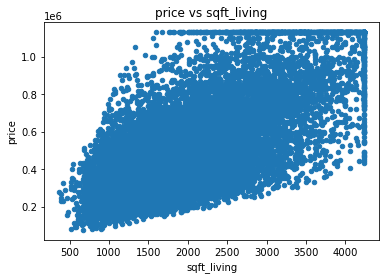

In [44]:
df.plot.scatter(x='sqft_living', y='price', title='price vs sqft_living')

### Homoscedasicity

<AxesSubplot:xlabel='fitted_value', ylabel='residual'>

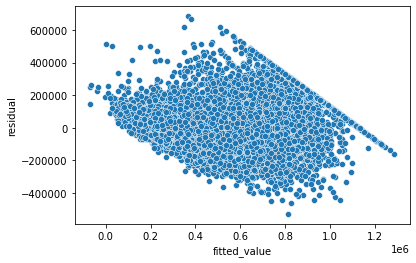

In [45]:
sns.scatterplot(x='fitted_value', y='residual',data=df)

### Normality

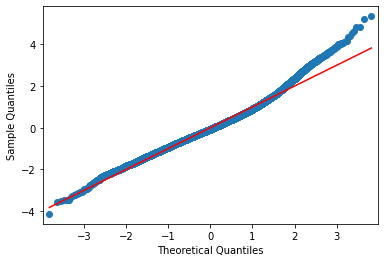

In [46]:
import statsmodels.api as sm
fig = sm.qqplot(df['residual'], fit=True, line='s') # s indicate standardized line
plt.show()

### Model Error are IID

<AxesSubplot:ylabel='Frequency'>

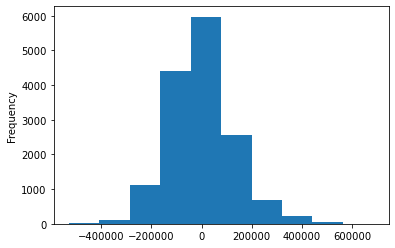

In [47]:
df['residual'].plot.hist()

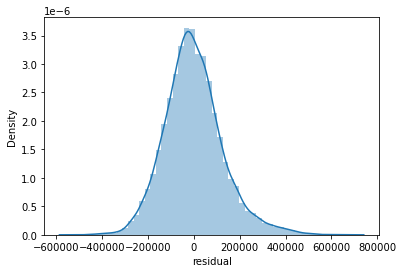

In [48]:
ax=sns.distplot(df.residual)

## Prediction on Test Data (unseen data)

In [49]:
df_test=pd.concat([x_test,y_test],axis=1)

df_test.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price
15939,3.0,1.00,1300.0,8160.0,1.0,4.0,7.0,1300.0,0.0,1960,98056,47.5110,-122.172,1290.0,8970.0,237000.0
8613,4.0,2.50,2980.0,10459.0,2.0,3.0,9.0,2980.0,0.0,2001,98019,47.7354,-121.974,2920.0,7700.0,565000.0
14889,5.0,1.75,1730.0,5200.0,1.0,4.0,7.0,1050.0,680.0,1978,98042,47.3628,-122.089,1350.0,5200.0,205000.0
4789,4.0,1.00,1960.0,19160.0,1.5,3.0,6.0,1960.0,0.0,1979,98027,47.5418,-121.962,2430.0,17557.5,371000.0
21269,5.0,2.75,2410.0,5003.0,1.0,3.0,7.0,1410.0,1000.0,2008,98118,47.5298,-122.274,1590.0,5003.0,365000.0


In [50]:
df_test['Prediction']=model.predict(df_test) # predict = all row prediction ( Auto )
df_test.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price,Prediction
15939,3.0,1.00,1300.0,8160.0,1.0,4.0,7.0,1300.0,0.0,1960,98056,47.5110,-122.172,1290.0,8970.0,237000.0,310398.597983
8613,4.0,2.50,2980.0,10459.0,2.0,3.0,9.0,2980.0,0.0,2001,98019,47.7354,-121.974,2920.0,7700.0,565000.0,804393.206645
14889,5.0,1.75,1730.0,5200.0,1.0,4.0,7.0,1050.0,680.0,1978,98042,47.3628,-122.089,1350.0,5200.0,205000.0,209448.030778
4789,4.0,1.00,1960.0,19160.0,1.5,3.0,6.0,1960.0,0.0,1979,98027,47.5418,-121.962,2430.0,17557.5,371000.0,280314.536545
21269,5.0,2.75,2410.0,5003.0,1.0,3.0,7.0,1410.0,1000.0,2008,98118,47.5298,-122.274,1590.0,5003.0,365000.0,331798.425771


## Test

In [51]:
from sklearn.metrics import r2_score
r2 = r2_score(df_test.price, df_test.Prediction)
print('R2 score for model Performance on Test', np.round(r2,2))

R2 score for model Performance on Test 0.73


## Train

In [52]:
from sklearn.metrics import r2_score
r2 = r2_score(df.price, df.fitted_value)
print('R2 score for model Performance on Test', np.round(r2,2))

R2 score for model Performance on Test 0.74


* Model is good fit & Performance on Test data is also good fit 

# Decision Tree Model

In [53]:
data.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3.0,1.00,1180.0,5650.0,1.0,3.0,7.0,1180.0,0.0,1955,98178,47.5112,-122.257,1340.0,5650.0
1,538000.0,3.0,2.25,2570.0,7242.0,2.0,3.0,7.0,2170.0,400.0,1951,98125,47.7210,-122.319,1690.0,7639.0
2,180000.0,2.0,1.00,770.0,10000.0,1.0,3.0,6.0,770.0,0.0,1933,98028,47.7379,-122.233,2720.0,8062.0
3,604000.0,4.0,3.00,1960.0,5000.0,1.0,5.0,7.0,1050.0,910.0,1965,98136,47.5208,-122.393,1360.0,5000.0
4,510000.0,3.0,2.00,1680.0,8080.0,1.0,3.0,8.0,1680.0,0.0,1987,98074,47.6168,-122.045,1800.0,7503.0


### Taking subset data of Number

In [54]:
data.select_dtypes(include=[np.number]).columns.tolist()

['price',
 'bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15']

In [55]:
numvariable = data[data.select_dtypes(include=[np.number]).columns.tolist()]
numvariable.head(3)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3.0,1.00,1180.0,5650.0,1.0,3.0,7.0,1180.0,0.0,1955,98178,47.5112,-122.257,1340.0,5650.0
1,538000.0,3.0,2.25,2570.0,7242.0,2.0,3.0,7.0,2170.0,400.0,1951,98125,47.7210,-122.319,1690.0,7639.0
2,180000.0,2.0,1.00,770.0,10000.0,1.0,3.0,6.0,770.0,0.0,1933,98028,47.7379,-122.233,2720.0,8062.0


In [56]:
numvariable.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3.0,1.00,1180.0,5650.0,1.0,3.0,7.0,1180.0,0.0,1955,98178,47.5112,-122.257,1340.0,5650.0
1,538000.0,3.0,2.25,2570.0,7242.0,2.0,3.0,7.0,2170.0,400.0,1951,98125,47.7210,-122.319,1690.0,7639.0
2,180000.0,2.0,1.00,770.0,10000.0,1.0,3.0,6.0,770.0,0.0,1933,98028,47.7379,-122.233,2720.0,8062.0
3,604000.0,4.0,3.00,1960.0,5000.0,1.0,5.0,7.0,1050.0,910.0,1965,98136,47.5208,-122.393,1360.0,5000.0
4,510000.0,3.0,2.00,1680.0,8080.0,1.0,3.0,8.0,1680.0,0.0,1987,98074,47.6168,-122.045,1800.0,7503.0


### Data Partition

In [57]:
#Dividing data into train and test dataset
from sklearn.model_selection import train_test_split
#from random import seed

#seed(20)
X = numvariable.drop(['price'],axis=1)
Y = numvariable[['price']]

# Train test split

X_train, X_test, Y_train, Y_test =train_test_split(X,Y,test_size=0.3,random_state=231)

### Model Building

In [58]:
def model_train(model, X_train, X_test, Y_train, Y_test):
    model.fit(X_train, Y_train)
    trainpred=model.predict(X_train)
    testpred = model.predict(X_test)
    print("R2 Score for train data :", r2_score(Y_train, trainpred))
    print("R2 Score for test  data :", r2_score(Y_test, testpred))
    #print("Mean Squared Error for train data :", mean_squared_error(Y_train, trainpred))
    #print("Mean Squared Error for test data :", mean_squared_error(Y_test, testpred))
    #print("Root Mean Squared Error for train data :", mean_squared_error(Y_train, trainpred)**0.5)
    #print("Root Mean Squared Error for test data :", mean_squared_error(Y_test, testpred)**0.5)

    #sns.regplot(y_test, testpred)

In [59]:
model=DecisionTreeRegressor(max_depth=4, random_state=1234)
model_train(model, X_train, X_test, Y_train, Y_test)

R2 Score for train data : 0.7301472064555821
R2 Score for test  data : 0.7078696338651804


## Plotting the Tree

## Ploting Tree
import graphviz 
from six import StringIO
#from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import pydot

In [60]:
train=pd.concat([Y_train,X_train],axis=1)
train.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
21236,288790.0,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0
3373,700000.0,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0
10170,389950.0,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0
21255,471835.0,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0
14631,334000.0,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0


In [61]:
independent_variable = list(train.columns[1:])
independent_variable

['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15']

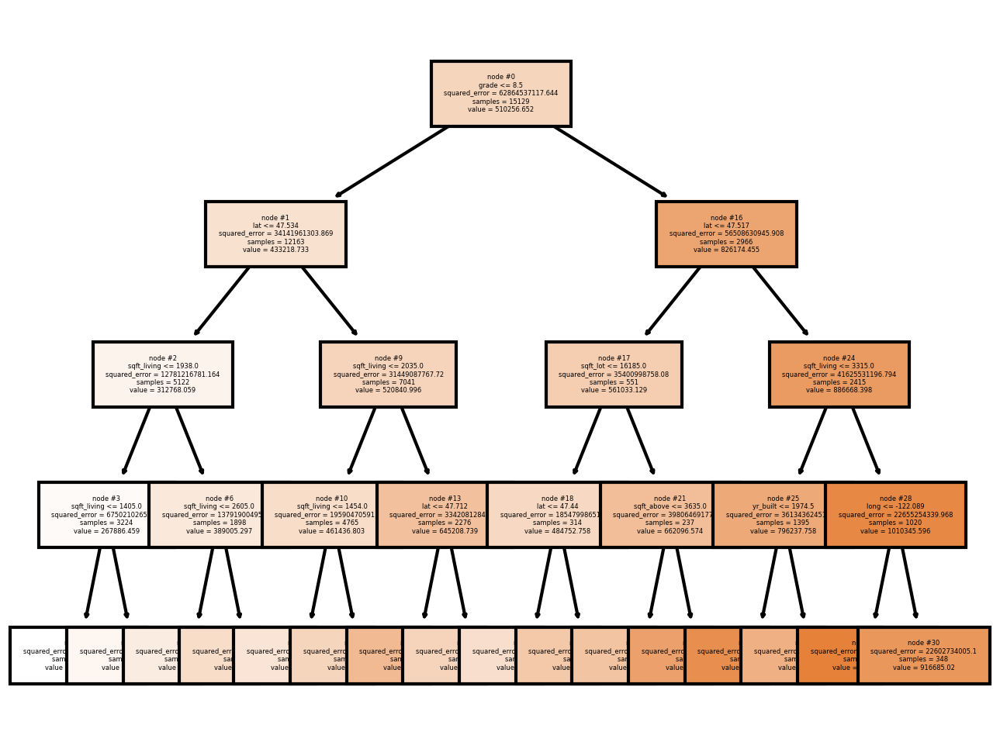

In [62]:
from sklearn import tree
import matplotlib.pyplot as plt


fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (5,4), dpi=300)
tree.plot_tree(model,  feature_names = independent_variable,  # column name
                # Yes , No
               filled = True, # colour
              node_ids=True, # node number
              fontsize=2); # 
#fig.savefig('imagename.png')

## Predictions on Train Dataset

In [63]:
train.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
21236,288790.0,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0
3373,700000.0,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0
10170,389950.0,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0
21255,471835.0,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0
14631,334000.0,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0


In [64]:
train['Predicted']=model.predict(X_train)  # MODEL = dt
train.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,Predicted
21236,288790.0,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0,409940.219306
3373,700000.0,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0,751595.414105
10170,389950.0,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0,445921.808696
21255,471835.0,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0,445921.808696
14631,334000.0,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0,512054.751144


## Predictions on Test Dataset

In [65]:
test=pd.concat([X_test,Y_test],axis=1)
test.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price
11791,3.0,3.25,1460.0,1592.0,2.0,3.0,8.0,1130.0,330.0,2006,98126,47.5481,-122.374,1560.0,1701.0,350000.0
20876,4.0,3.00,1984.0,4419.0,2.0,3.0,7.0,1984.0,0.0,2010,98002,47.3514,-122.213,2440.0,4418.0,300000.0
19906,3.0,3.50,1690.0,1765.0,2.0,3.0,8.0,1370.0,320.0,2006,98103,47.6536,-122.340,1690.0,1694.0,622000.0
9964,3.0,1.00,1120.0,9075.0,1.0,3.0,7.0,1120.0,0.0,1977,98077,47.7551,-122.072,1120.0,9705.0,335000.0
11450,3.0,2.75,2210.0,4000.0,2.0,3.0,8.0,2210.0,0.0,2008,98053,47.6954,-122.017,2230.0,4674.0,660000.0


In [66]:
test['Predicted']=model.predict(X_test)
test.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price,Predicted
11791,3.0,3.25,1460.0,1592.0,2.0,3.0,8.0,1130.0,330.0,2006,98126,47.5481,-122.374,1560.0,1701.0,350000.0,512054.751144
20876,4.0,3.00,1984.0,4419.0,2.0,3.0,7.0,1984.0,0.0,2010,98002,47.3514,-122.213,2440.0,4418.0,300000.0,362845.861549
19906,3.0,3.50,1690.0,1765.0,2.0,3.0,8.0,1370.0,320.0,2006,98103,47.6536,-122.340,1690.0,1694.0,622000.0,512054.751144
9964,3.0,1.00,1120.0,9075.0,1.0,3.0,7.0,1120.0,0.0,1977,98077,47.7551,-122.072,1120.0,9705.0,335000.0,409940.219306
11450,3.0,2.75,2210.0,4000.0,2.0,3.0,8.0,2210.0,0.0,2008,98053,47.6954,-122.017,2230.0,4674.0,660000.0,688227.303603


## Accuracy of Train and Test Dataset

In [67]:
model_train(model, X_train, X_test, Y_train, Y_test)

R2 Score for train data : 0.7301472064555821
R2 Score for test  data : 0.7078696338651804


### Grid Search Method

In [68]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
params = { 'min_samples_split': [200, 400,500,100,300,600], ## Parent 
           'min_samples_leaf': [70,100,80,200,50,90], ## Child or Leave 
           'max_depth':[4,5,6,8,2,1]}  # Branches
grid_search_cv = GridSearchCV(DecisionTreeRegressor(random_state=42),
                              params, 
                              verbose=1, 
                              cv=10)
grid_search_cv.fit(X_train, Y_train)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits


GridSearchCV(cv=10, estimator=DecisionTreeRegressor(random_state=42),
             param_grid={'max_depth': [4, 5, 6, 8, 2, 1],
                         'min_samples_leaf': [70, 100, 80, 200, 50, 90],
                         'min_samples_split': [200, 400, 500, 100, 300, 600]},
             verbose=1)

In [69]:
grid_search_cv.best_estimator_

DecisionTreeRegressor(max_depth=8, min_samples_leaf=50, min_samples_split=100,
                      random_state=42)

# Random Forest Model

In [70]:
numvariable.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3.0,1.00,1180.0,5650.0,1.0,3.0,7.0,1180.0,0.0,1955,98178,47.5112,-122.257,1340.0,5650.0
1,538000.0,3.0,2.25,2570.0,7242.0,2.0,3.0,7.0,2170.0,400.0,1951,98125,47.7210,-122.319,1690.0,7639.0
2,180000.0,2.0,1.00,770.0,10000.0,1.0,3.0,6.0,770.0,0.0,1933,98028,47.7379,-122.233,2720.0,8062.0
3,604000.0,4.0,3.00,1960.0,5000.0,1.0,5.0,7.0,1050.0,910.0,1965,98136,47.5208,-122.393,1360.0,5000.0
4,510000.0,3.0,2.00,1680.0,8080.0,1.0,3.0,8.0,1680.0,0.0,1987,98074,47.6168,-122.045,1800.0,7503.0


In [71]:
model=RandomForestRegressor(max_depth=8, max_features='sqrt', min_samples_leaf=50,
                      min_samples_split=100, n_estimators=20)
model_train(model, X_train, X_test, Y_train, Y_test)

R2 Score for train data : 0.830970696750625
R2 Score for test  data : 0.8105834993283192


### Importance Features

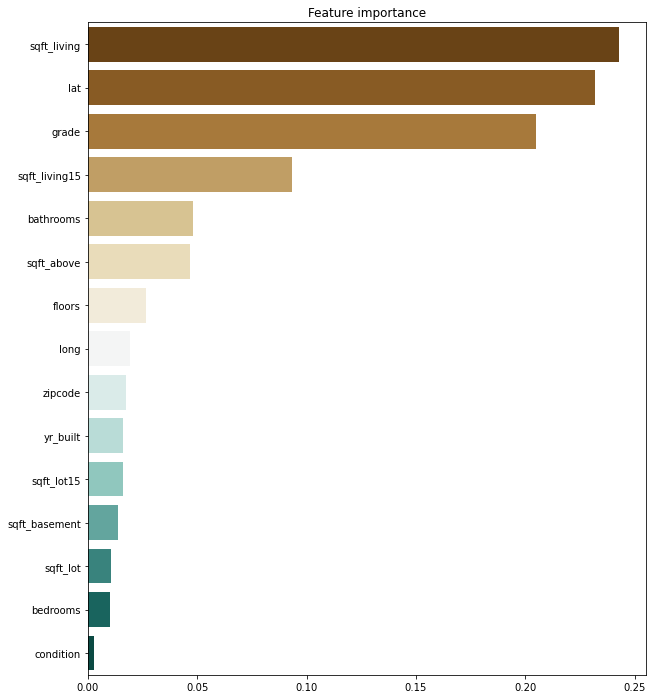

In [72]:
# Plot features importances
imp = pd.Series(data=model.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10,12))
plt.title("Feature importance")
ax = sns.barplot(y=imp.index, x=imp.values, palette="BrBG", orient='h')


### Random Forest Visualization

In [73]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot

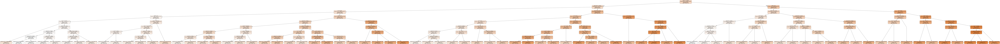

In [74]:
tree = model.estimators_[1]
# specify the tree number   
# Export the image to a dot file
feature_list = list(X.columns)  # all independent variable name
export_graphviz(tree, out_file = 'abc.dot', 
                feature_names = feature_list, 
                leaves_parallel=True,
                rounded = True, 
                filled=True)
# Use dot file to create a graph
(graph,)= pydot.graph_from_dot_file('abc.dot')
# Write graph to a png file
graph.write_png('tree.png')
from IPython.display import Image
Image(filename = 'tree.png')

## Predictions on Train Dataset

In [75]:
Train=pd.concat([X_train,Y_train],axis=1)
Train.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price
21236,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0,288790.0
3373,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0,700000.0
10170,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0,389950.0
21255,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0,471835.0
14631,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0,334000.0


In [76]:
Train['Prediction']=model.predict(X_train)
Train.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price,Prediction
21236,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0,288790.0,384352.203652
3373,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0,700000.0,725859.157409
10170,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0,389950.0,547451.136997
21255,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0,471835.0,537944.659248
14631,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0,334000.0,453901.816062


## Predictions on Test Dataset

In [77]:
Test=pd.concat([X_test,Y_test],axis=1)
Test.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price
11791,3.0,3.25,1460.0,1592.0,2.0,3.0,8.0,1130.0,330.0,2006,98126,47.5481,-122.374,1560.0,1701.0,350000.0
20876,4.0,3.00,1984.0,4419.0,2.0,3.0,7.0,1984.0,0.0,2010,98002,47.3514,-122.213,2440.0,4418.0,300000.0
19906,3.0,3.50,1690.0,1765.0,2.0,3.0,8.0,1370.0,320.0,2006,98103,47.6536,-122.340,1690.0,1694.0,622000.0
9964,3.0,1.00,1120.0,9075.0,1.0,3.0,7.0,1120.0,0.0,1977,98077,47.7551,-122.072,1120.0,9705.0,335000.0
11450,3.0,2.75,2210.0,4000.0,2.0,3.0,8.0,2210.0,0.0,2008,98053,47.6954,-122.017,2230.0,4674.0,660000.0


In [78]:
Test['Prediction']=model.predict(X_test)
Test.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price,Prediction
11791,3.0,3.25,1460.0,1592.0,2.0,3.0,8.0,1130.0,330.0,2006,98126,47.5481,-122.374,1560.0,1701.0,350000.0,446651.382464
20876,4.0,3.00,1984.0,4419.0,2.0,3.0,7.0,1984.0,0.0,2010,98002,47.3514,-122.213,2440.0,4418.0,300000.0,350356.712248
19906,3.0,3.50,1690.0,1765.0,2.0,3.0,8.0,1370.0,320.0,2006,98103,47.6536,-122.340,1690.0,1694.0,622000.0,551942.384530
9964,3.0,1.00,1120.0,9075.0,1.0,3.0,7.0,1120.0,0.0,1977,98077,47.7551,-122.072,1120.0,9705.0,335000.0,346383.009993
11450,3.0,2.75,2210.0,4000.0,2.0,3.0,8.0,2210.0,0.0,2008,98053,47.6954,-122.017,2230.0,4674.0,660000.0,564632.009404


## Accuracy of Train and  Test Model

In [79]:
model=RandomForestRegressor(max_depth=8, max_features='sqrt', min_samples_leaf=50,
                      min_samples_split=100, n_estimators=20)
model_train(model, X_train, X_test, Y_train, Y_test)

R2 Score for train data : 0.8232366532823431
R2 Score for test  data : 0.8061242881996861


# K-Nearest Neighbour Model

In [80]:
numvariable.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3.0,1.00,1180.0,5650.0,1.0,3.0,7.0,1180.0,0.0,1955,98178,47.5112,-122.257,1340.0,5650.0
1,538000.0,3.0,2.25,2570.0,7242.0,2.0,3.0,7.0,2170.0,400.0,1951,98125,47.7210,-122.319,1690.0,7639.0
2,180000.0,2.0,1.00,770.0,10000.0,1.0,3.0,6.0,770.0,0.0,1933,98028,47.7379,-122.233,2720.0,8062.0
3,604000.0,4.0,3.00,1960.0,5000.0,1.0,5.0,7.0,1050.0,910.0,1965,98136,47.5208,-122.393,1360.0,5000.0
4,510000.0,3.0,2.00,1680.0,8080.0,1.0,3.0,8.0,1680.0,0.0,1987,98074,47.6168,-122.045,1800.0,7503.0


## Model Building

In [81]:
from sklearn.neighbors import KNeighborsRegressor
model=KNeighborsRegressor(n_neighbors=5)
model_train(model, X_train, X_test, Y_train, Y_test)

R2 Score for train data : 0.7001080860958628
R2 Score for test  data : 0.5431072370844359


## Predictions on Train Dataset

In [82]:
knntrain=pd.concat([X_train,Y_train],axis=1)
knntrain.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price
21236,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0,288790.0
3373,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0,700000.0
10170,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0,389950.0
21255,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0,471835.0
14631,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0,334000.0


In [83]:
knntrain['prediction']=model.predict(X_train)
knntrain.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price,prediction
21236,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0,288790.0,331358.0
3373,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0,700000.0,832358.8
10170,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0,389950.0,637701.0
21255,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0,471835.0,533415.0
14631,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0,334000.0,314720.0


### Predictions on Test Dataset

In [84]:
knntest=pd.concat([X_test,Y_test],axis=1)
knntest.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price
11791,3.0,3.25,1460.0,1592.0,2.0,3.0,8.0,1130.0,330.0,2006,98126,47.5481,-122.374,1560.0,1701.0,350000.0
20876,4.0,3.00,1984.0,4419.0,2.0,3.0,7.0,1984.0,0.0,2010,98002,47.3514,-122.213,2440.0,4418.0,300000.0
19906,3.0,3.50,1690.0,1765.0,2.0,3.0,8.0,1370.0,320.0,2006,98103,47.6536,-122.340,1690.0,1694.0,622000.0
9964,3.0,1.00,1120.0,9075.0,1.0,3.0,7.0,1120.0,0.0,1977,98077,47.7551,-122.072,1120.0,9705.0,335000.0
11450,3.0,2.75,2210.0,4000.0,2.0,3.0,8.0,2210.0,0.0,2008,98053,47.6954,-122.017,2230.0,4674.0,660000.0


In [85]:
knntest['prediction']=model.predict(X_test)
knntest.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price,prediction
11791,3.0,3.25,1460.0,1592.0,2.0,3.0,8.0,1130.0,330.0,2006,98126,47.5481,-122.374,1560.0,1701.0,350000.0,489000.0
20876,4.0,3.00,1984.0,4419.0,2.0,3.0,7.0,1984.0,0.0,2010,98002,47.3514,-122.213,2440.0,4418.0,300000.0,342170.0
19906,3.0,3.50,1690.0,1765.0,2.0,3.0,8.0,1370.0,320.0,2006,98103,47.6536,-122.340,1690.0,1694.0,622000.0,510300.0
9964,3.0,1.00,1120.0,9075.0,1.0,3.0,7.0,1120.0,0.0,1977,98077,47.7551,-122.072,1120.0,9705.0,335000.0,242930.0
11450,3.0,2.75,2210.0,4000.0,2.0,3.0,8.0,2210.0,0.0,2008,98053,47.6954,-122.017,2230.0,4674.0,660000.0,415100.0


## Accuracy of Train and Test Model

In [86]:
model=KNeighborsRegressor(n_neighbors=5)
model_train(model, X_train, X_test, Y_train, Y_test)

R2 Score for train data : 0.7001080860958628
R2 Score for test  data : 0.5431072370844359


# Support Vector Regressor

In [87]:
numvariable.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3.0,1.00,1180.0,5650.0,1.0,3.0,7.0,1180.0,0.0,1955,98178,47.5112,-122.257,1340.0,5650.0
1,538000.0,3.0,2.25,2570.0,7242.0,2.0,3.0,7.0,2170.0,400.0,1951,98125,47.7210,-122.319,1690.0,7639.0
2,180000.0,2.0,1.00,770.0,10000.0,1.0,3.0,6.0,770.0,0.0,1933,98028,47.7379,-122.233,2720.0,8062.0
3,604000.0,4.0,3.00,1960.0,5000.0,1.0,5.0,7.0,1050.0,910.0,1965,98136,47.5208,-122.393,1360.0,5000.0
4,510000.0,3.0,2.00,1680.0,8080.0,1.0,3.0,8.0,1680.0,0.0,1987,98074,47.6168,-122.045,1800.0,7503.0


In [88]:
from sklearn.svm import SVR
#from sklearn.svm import LinearSVC
model = SVR(kernel="linear")  # if we use linear then only we get support_vector
model.fit(X_train,Y_train)
#model_train(model, X_train, X_test, Y_train, Y_test)


SVR(kernel='linear')

In [89]:
model_train(model, X_train, X_test, Y_train, Y_test)

R2 Score for train data : 0.5789768242596429
R2 Score for test  data : 0.5686227408598564


## Predictions on Train Dataset

In [90]:
svrtrain=pd.concat([X_train,Y_train],axis=1)
svrtrain.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price
21236,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0,288790.0
3373,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0,700000.0
10170,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0,389950.0
21255,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0,471835.0
14631,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0,334000.0


In [91]:
svrtrain['prediction']=model.predict(X_train)
svrtrain.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price,prediction
21236,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0,288790.0,285951.233004
3373,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0,700000.0,789493.094412
10170,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0,389950.0,784107.543992
21255,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0,471835.0,763679.393347
14631,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0,334000.0,529997.126433


 ## Prediction on Test Dataset

In [92]:
svrtest=pd.concat([X_test,Y_test],axis=1)
svrtest.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price
11791,3.0,3.25,1460.0,1592.0,2.0,3.0,8.0,1130.0,330.0,2006,98126,47.5481,-122.374,1560.0,1701.0,350000.0
20876,4.0,3.00,1984.0,4419.0,2.0,3.0,7.0,1984.0,0.0,2010,98002,47.3514,-122.213,2440.0,4418.0,300000.0
19906,3.0,3.50,1690.0,1765.0,2.0,3.0,8.0,1370.0,320.0,2006,98103,47.6536,-122.340,1690.0,1694.0,622000.0
9964,3.0,1.00,1120.0,9075.0,1.0,3.0,7.0,1120.0,0.0,1977,98077,47.7551,-122.072,1120.0,9705.0,335000.0
11450,3.0,2.75,2210.0,4000.0,2.0,3.0,8.0,2210.0,0.0,2008,98053,47.6954,-122.017,2230.0,4674.0,660000.0


In [93]:
svrtest['prediction']=model.predict(X_test)
svrtest.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price,prediction
11791,3.0,3.25,1460.0,1592.0,2.0,3.0,8.0,1130.0,330.0,2006,98126,47.5481,-122.374,1560.0,1701.0,350000.0,353691.296992
20876,4.0,3.00,1984.0,4419.0,2.0,3.0,7.0,1984.0,0.0,2010,98002,47.3514,-122.213,2440.0,4418.0,300000.0,489127.066351
19906,3.0,3.50,1690.0,1765.0,2.0,3.0,8.0,1370.0,320.0,2006,98103,47.6536,-122.340,1690.0,1694.0,622000.0,404204.086754
9964,3.0,1.00,1120.0,9075.0,1.0,3.0,7.0,1120.0,0.0,1977,98077,47.7551,-122.072,1120.0,9705.0,335000.0,211102.772324
11450,3.0,2.75,2210.0,4000.0,2.0,3.0,8.0,2210.0,0.0,2008,98053,47.6954,-122.017,2230.0,4674.0,660000.0,528492.394652


## Accuracy of Train and Test

In [94]:
model_train(model, X_train, X_test, Y_train, Y_test)

R2 Score for train data : 0.5789768242596429
R2 Score for test  data : 0.5686227408598564


# Enseble Techniques - XGBoost Regressor

In [95]:
from xgboost.sklearn import XGBRegressor
import xgboost as xgb
model = XGBRegressor()

In [96]:
# Define Model parameters to tune
# n_estimators=The number of boosting stages to perform.
model_parameters = {'n_estimators': [10, 50], # number of tress
                    'max_depth':    [3, 5],      # maximum branches in tree
                    'learning_rate':[0.8, 0.6]} #parent 

In [97]:
# Gridsearch the parameters to find the best parameters. Using L2 penalty
model = XGBRegressor(reg_lambda=0)   # Lamda = 0 
gscv = GridSearchCV(estimator=model, 
                    param_grid=model_parameters, 
                    cv=5, 
                    verbose=1, 
                    n_jobs=-1,
                    scoring='accuracy')

gscv.fit(X_train, Y_train)  ## Model building

Fitting 5 folds for each of 8 candidates, totalling 40 fits


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
          

In [98]:
print('The best parameter are -', gscv.best_params_)

The best parameter are - {'learning_rate': 0.8, 'max_depth': 3, 'n_estimators': 10}


In [99]:
# Re-fit the model with the best parameters
final_mod = XGBRegressor(**gscv.best_params_)
final_mod.fit(X_train, Y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.8, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=3, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=10, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [100]:
parent_params = {'shape':'box',
               'style':'filled,rounded',
                'fillcolor' :'#78cbec'}
child_params = {'shape':'box',
               'style':'filled',
                'fillcolor' :'#e48038'}

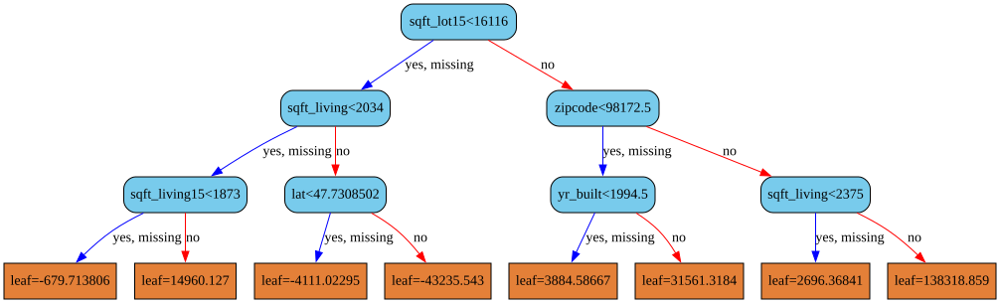

In [101]:
xgb.to_graphviz(final_mod,num_trees=9,size="5,5",   # Tree = 10 
               condition_node_params=parent_params,
               leaf_node_params=child_params)

## Prediction on Train Dataset

In [102]:
xgbtrain=pd.concat([X_train,Y_train],axis=1)
xgbtrain

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price
21236,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0,288790.0
3373,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0,700000.0
10170,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0,389950.0
21255,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0,471835.0
14631,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0,334000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,4.0,2.50,2060.0,5742.0,2.0,3.0,7.0,2060.0,0.0,1999,98030,47.3612,-122.185,1610.0,7298.0,275000.0
11604,3.0,2.50,1880.0,5290.0,1.0,3.0,8.0,1250.0,630.0,1974,98108,47.5401,-122.300,2030.0,5092.0,355000.0
19934,3.0,2.50,2570.0,4600.0,2.0,3.0,8.0,2570.0,0.0,2014,98092,47.2582,-122.196,2570.0,5000.0,339990.0
14996,4.0,2.50,2540.0,8400.0,2.0,5.0,7.0,2540.0,0.0,1977,98032,47.3754,-122.277,1600.0,8050.0,269950.0


In [103]:
xgbtrain['prediction']=final_mod.predict(X_train)
xgbtrain.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price,prediction
21236,4.0,2.00,1350.0,942.0,3.0,3.0,7.0,1350.0,0.0,2008,98027,47.5401,-122.026,1390.0,942.0,288790.0,347089.90625
3373,4.0,3.00,3150.0,7778.0,2.0,3.0,9.0,3150.0,0.0,2000,98075,47.5972,-122.018,2970.0,6500.0,700000.0,706404.18750
10170,4.0,2.50,3140.0,8060.0,2.0,3.0,9.0,3140.0,0.0,1991,98023,47.3091,-122.343,3000.0,8060.0,389950.0,416323.84375
21255,4.0,2.50,3281.0,5354.0,2.0,3.0,9.0,3281.0,0.0,2014,98092,47.3273,-122.163,2598.0,4815.0,471835.0,438012.28125
14631,2.0,1.75,1680.0,8367.0,1.0,3.0,6.0,840.0,840.0,1914,98115,47.6976,-122.288,1830.0,6720.0,334000.0,498685.50000


## Prediction on Test Data set

In [104]:
xgbtest=pd.concat([X_test,Y_test],axis=1)
xgbtest

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price
11791,3.0,3.25,1460.0,1592.0,2.0,3.0,8.0,1130.0,330.0,2006,98126,47.5481,-122.374,1560.0,1701.0,350000.0
20876,4.0,3.00,1984.0,4419.0,2.0,3.0,7.0,1984.0,0.0,2010,98002,47.3514,-122.213,2440.0,4418.0,300000.0
19906,3.0,3.50,1690.0,1765.0,2.0,3.0,8.0,1370.0,320.0,2006,98103,47.6536,-122.340,1690.0,1694.0,622000.0
9964,3.0,1.00,1120.0,9075.0,1.0,3.0,7.0,1120.0,0.0,1977,98077,47.7551,-122.072,1120.0,9705.0,335000.0
11450,3.0,2.75,2210.0,4000.0,2.0,3.0,8.0,2210.0,0.0,2008,98053,47.6954,-122.017,2230.0,4674.0,660000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9293,3.0,2.50,2090.0,12027.0,2.0,3.0,8.0,2090.0,0.0,1991,98031,47.4084,-122.213,2090.0,12666.0,327500.0
9955,1.5,1.00,630.0,5150.0,1.0,4.0,5.5,630.0,0.0,1954,98117,47.6923,-122.369,1390.0,5150.0,396000.0
15792,3.0,1.00,1190.0,9000.0,1.0,3.0,7.0,1190.0,0.0,1968,98028,47.7700,-122.264,1960.0,7200.0,268300.0
18183,4.0,3.50,4234.5,19160.0,2.0,3.0,9.0,3740.0,390.0,1995,98006,47.5589,-122.116,2990.0,11381.0,1100000.0


In [105]:
xgbtest['prediction']=final_mod.predict(X_test)
xgbtest.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,price,prediction
11791,3.0,3.25,1460.0,1592.0,2.0,3.0,8.0,1130.0,330.0,2006,98126,47.5481,-122.374,1560.0,1701.0,350000.0,426370.7500
20876,4.0,3.00,1984.0,4419.0,2.0,3.0,7.0,1984.0,0.0,2010,98002,47.3514,-122.213,2440.0,4418.0,300000.0,312818.5000
19906,3.0,3.50,1690.0,1765.0,2.0,3.0,8.0,1370.0,320.0,2006,98103,47.6536,-122.340,1690.0,1694.0,622000.0,529806.3750
9964,3.0,1.00,1120.0,9075.0,1.0,3.0,7.0,1120.0,0.0,1977,98077,47.7551,-122.072,1120.0,9705.0,335000.0,306657.2500
11450,3.0,2.75,2210.0,4000.0,2.0,3.0,8.0,2210.0,0.0,2008,98053,47.6954,-122.017,2230.0,4674.0,660000.0,627372.9375


## Accuracy of Train and Test

In [106]:
model_train(model, X_train, X_test, Y_train, Y_test)


R2 Score for train data : 0.9643210293134794
R2 Score for test  data : 0.8792242135098014


## Importance Features 

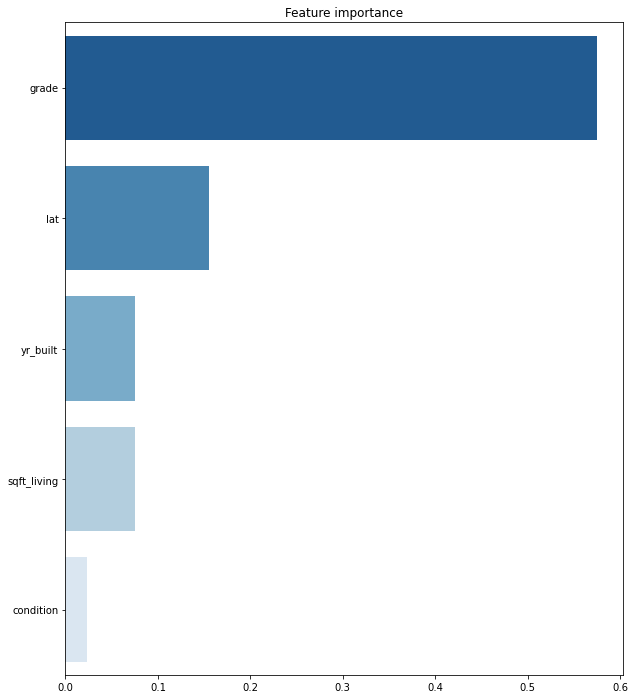

In [107]:
imp = pd.Series(data=final_mod.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10,12))
plt.title("Feature importance")
ax = sns.barplot(y=imp.head().index, x=imp.head().values, palette="Blues_r", orient='h')

# Final Prediction

# Finished...!